In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import data_analysis_tools as tools
import re
import random

## BASELINE

In [2]:
OVERRIDE_OLD_FIXED = False
TEST = False

In [3]:
base_path = "C:/extincao-qpd/logs_good/"
baseline_paths = [
	# f"{base_path}baseline/4_ghosts_4_target_spread/",
	# f"{base_path}baseline/2_ghosts_0_target_spread/",
	# f"{base_path}baseline/2_ghosts_fixed_target_2_-5/",
	# f"{base_path}baseline/2_ghosts_fixed_target_4_-5/",
]

neuroevolution_paths = [
	# f"{base_path}neuroevolution/battery_3_0/",
	
	# f"{base_path}neuroevolution/B1/",
	# f"{base_path}neuroevolution/B1-path-grading-hack/",
	# f"{base_path}neuroevolution/B1-path-grading-simple/",
	f"{base_path}neuroevolution/B2/",
	# f"{base_path}neuroevolution/B3/",
	# f"{base_path}neuroevolution/NB4/",
	# f"{base_path}neuroevolution/NB4-path-grading/",
]

neat_paths = [
	# f"{base_path}NEAT/battery_3_0/",
	# f"{base_path}NEAT/saved_logs/no_speciation/",

	# f"{base_path}NEAT/history_size_100/B1/",
	# f"{base_path}NEAT/history_size_100/B1-path-grading-hack/",
	# f"{base_path}NEAT/history_size_100/B1-path-grading-simple/",
	# f"{base_path}NEAT/history_size_100/B2/",
	# f"{base_path}NEAT/history_size_100/B3/",
	# f"{base_path}NEAT/history_size_100/NB4/",
	# f"{base_path}NEAT/history_size_100/NB4-path-grading/",

	# f"{base_path}NEAT/saved_logs/speciated/B1/",
	# f"{base_path}NEAT/saved_logs/speciated/B1-path-grading-hack/",
	# f"{base_path}NEAT/saved_logs/speciated/B1-path-grading-simple/",
	# f"{base_path}NEAT/saved_logs/speciated/B2/",
	# f"{base_path}NEAT/saved_logs/speciated/B3/",
	# f"{base_path}NEAT/saved_logs/speciated/NB4/",
	# f"{base_path}NEAT/saved_logs/speciated/NB4-path-grading/",
]
selected_paths = baseline_paths + neuroevolution_paths + neat_paths

In [4]:
def prepare_data_fixed(path, selected_runs):
	for selected_run in selected_runs:
		this_path = f"{path}{selected_run}.data"
		if not os.path.exists(this_path + "_fixed") or OVERRIDE_OLD_FIXED:
			if not os.path.exists(this_path) or OVERRIDE_OLD_FIXED:
				#join data if necessary
				tools.join_data(this_path)
			tools.quote_gene(this_path)

def get_availiable_runs(filenames_list):
	selected_runs_set = set()
	for filename in filenames_list:
		found = re.findall("[0-9]+", filename)
		if len(found) > 0:
			selected_runs_set.add(found[0])
	return list(selected_runs_set)

def analyse_all_in_path(path):
	in_path_df_dict = dict()
	selected_runs = get_availiable_runs(os.listdir(path))
	prepare_data_fixed(path, selected_runs)
	errors = list()

	for run in selected_runs:
		this_baseline_mode = None
		this_ann_layers = None
		print(path, run)
		run_dict = dict()
		run_dict["run_id"] = run
		run_dict["path"] = path
		with open(f"{path}{run}.conf", 'r') as f:
			for line in f.readlines():
				if tools.ANN_MODE_STRING in line:
					this_mode = line.replace(tools.ANN_MODE_STRING, "")
					run_dict["mode"] = this_mode
				elif tools.ANN_LAYERS_STRING in line:
					this_layers = line.replace(tools.ANN_LAYERS_STRING, "")
					run_dict["layers"] = this_layers

		run_dict["df"], load_errors = tools.load_dataframe(path, run)
		in_path_df_dict[run] = run_dict
		errors.extend(load_errors)
		if TEST == True:
			return in_path_df_dict, errors

	return in_path_df_dict, errors


## Do it

C:/extincao-qpd/logs_good/neuroevolution/B1/ 1670941951
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1670941951.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1670942019
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1670942019.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1671289383
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1671289383.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1671132484
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1671132484.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1671289704
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1671289704.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1670698809
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1670698809.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B1/ 1670698617
Dataframe:  C:/extincao-qpd/logs_good/neuroevolution/B1/1670698617.pd  loaded.
C:/extincao-qpd/logs_good/neuroevolution/B2/ 1670942042

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

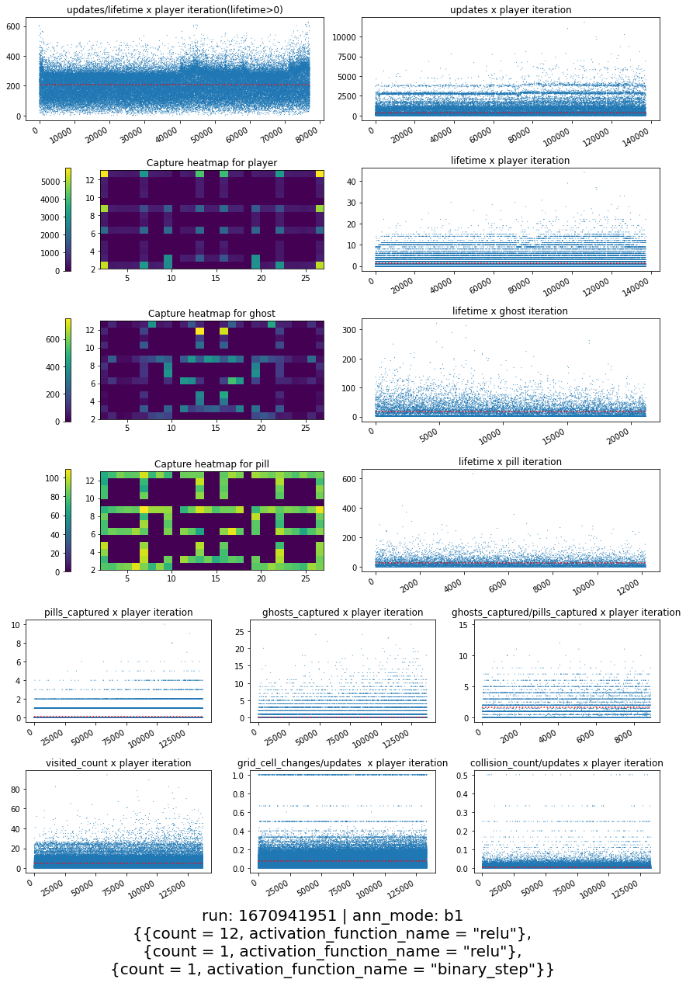

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.35945008527972533 rs: 0.5442801845138245 T: 0.41685110675697756
updates/lifetime updates r: 0.4598539387759721 rs: 0.9085195537154959 T: 0.8072989692977017
updates/lifetime visited_count r: 0.13824645711005287 rs: 0.13112741195034647 T: 0.09251074837867075
updates/lifetime grid_cell_changes r: 0.24939320800425532 rs: 0.34630949180117665 T: 0.24182679031874255
updates/lifetime collision_count r: 0.036350229520069714 rs: 0.011322908091624869 T: 0.00952832559422975
updates/lifetime ghosts_captured r: 0.18966044755014014 rs: 0.29469246156543727 T: 0.2371274033490887
updates/lifetime pills_captured r: 0.2708930033558099 rs: 0.35246315594964295 T: 0.2854086653031244
Updates e as outras metricas
updates lifetime r: 0.9820383443051061 rs: 0.7522059868181407 T: 0.6464038137847221
updates visited_count r: 0.2872075916065109 rs: 0.2995930874523661 T: 0.21892891528454758
updates grid_cell_changes r: 0.5686081672215235 rs: 0.

c:\Users\guiprada\miniconda3\envs\cemeai37\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


lifetime pills_captured r: 0.8264204902926305 rs: 0.4534202906963536 T: 0.4256532245387055
As metricas de movimentacao
cells_visited grid_cell_changes r: 0.26176092031788 rs: 0.6557081077450164 T: 0.6031074914921528
cells_visited collision_count r: 0.2443885987984921 rs: 0.29142967571618106 T: 0.2507226179030964
grid_cell_changes collision_count r: 0.0047128495248549085 rs: 0.07431564623390441 T: 0.06375143716032997
As metricas de captura
ghosts_captured pills_captured r: 0.7332158502806906 rs: 0.839987393504368 T: 0.8302410773957475


<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

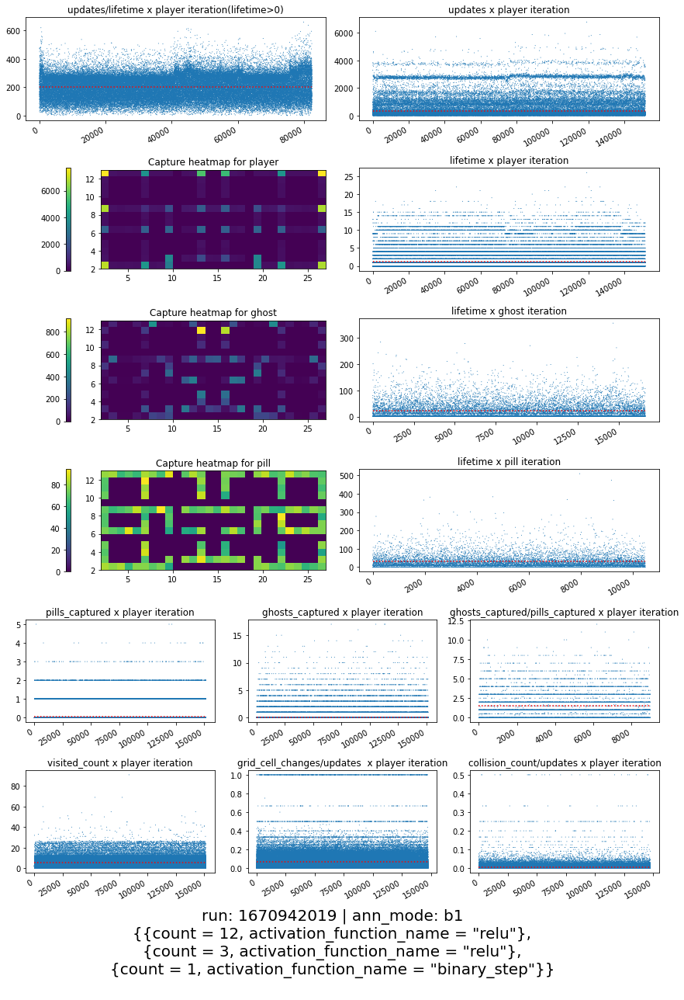

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.3905214048468227 rs: 0.5702003936126937 T: 0.43633236908819273
updates/lifetime updates r: 0.49909721503249727 rs: 0.9287353427037278 T: 0.837205386259466
updates/lifetime visited_count r: 0.1035858637609453 rs: 0.08869951978573491 T: 0.06210166687295375
updates/lifetime grid_cell_changes r: 0.20055416988996436 rs: 0.2425347547359493 T: 0.168804209871968
updates/lifetime collision_count r: 0.05020907434171968 rs: 0.04212390520915894 T: 0.034469478616587654
updates/lifetime ghosts_captured r: 0.19929095622300394 rs: 0.2932344530182069 T: 0.23617044483118133
updates/lifetime pills_captured r: 0.29916007500433656 rs: 0.3650811582136297 T: 0.29640229207896207
Updates e as outras metricas
updates lifetime r: 0.9778268745794662 rs: 0.7301235802821365 T: 0.6249109481582005
updates visited_count r: 0.20769183050524634 rs: 0.2653513527788682 T: 0.1927835378205991
updates grid_cell_changes r: 0.3078853590056703 rs: 0.40718

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

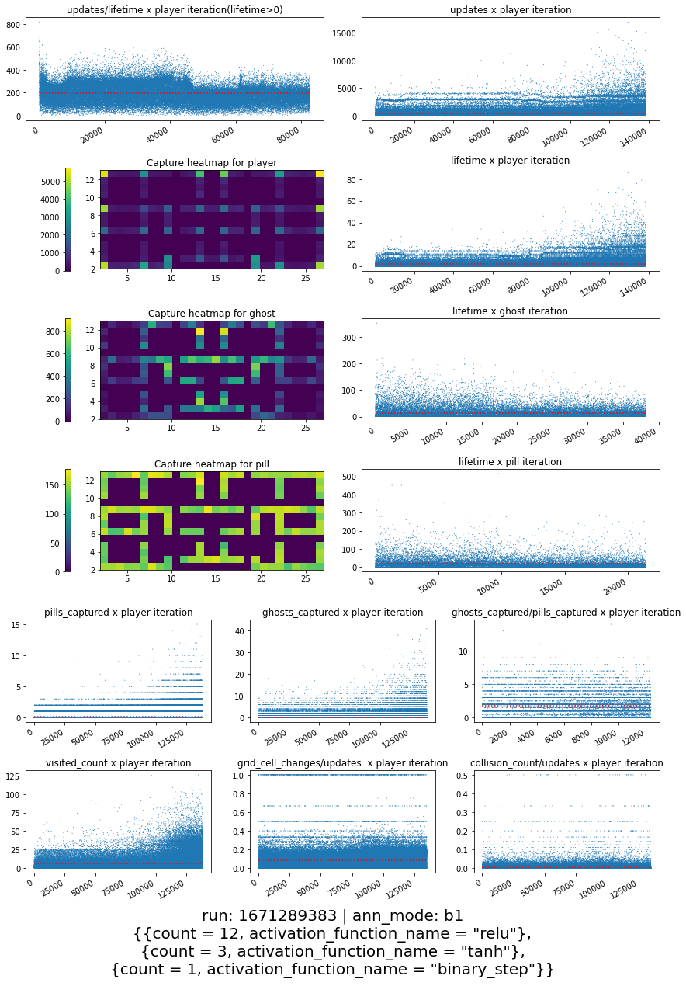

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.19787659517644635 rs: 0.4261107023939723 T: 0.315395421586558
updates/lifetime updates r: 0.3287944631116301 rs: 0.8069630610496275 T: 0.6898761658233596
updates/lifetime visited_count r: 0.09234053974311328 rs: 0.11872447503181927 T: 0.08138025576407759
updates/lifetime grid_cell_changes r: 0.10522966057740711 rs: 0.23759292502927315 T: 0.16191401574679237
updates/lifetime collision_count r: 0.05390952120673958 rs: 0.042118352422638804 T: 0.03394256130471963
updates/lifetime ghosts_captured r: 0.11187448656963231 rs: 0.22697953548708683 T: 0.17975272346940008
updates/lifetime pills_captured r: 0.15486402947140807 rs: 0.2782507403309608 T: 0.21937276616096676
Updates e as outras metricas
updates lifetime r: 0.9778694217364045 rs: 0.7882062798870906 T: 0.6802639403774662
updates visited_count r: 0.5027145124662932 rs: 0.3816459216840394 T: 0.27771498235838127
updates grid_cell_changes r: 0.7740654460437669 rs: 0.5

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

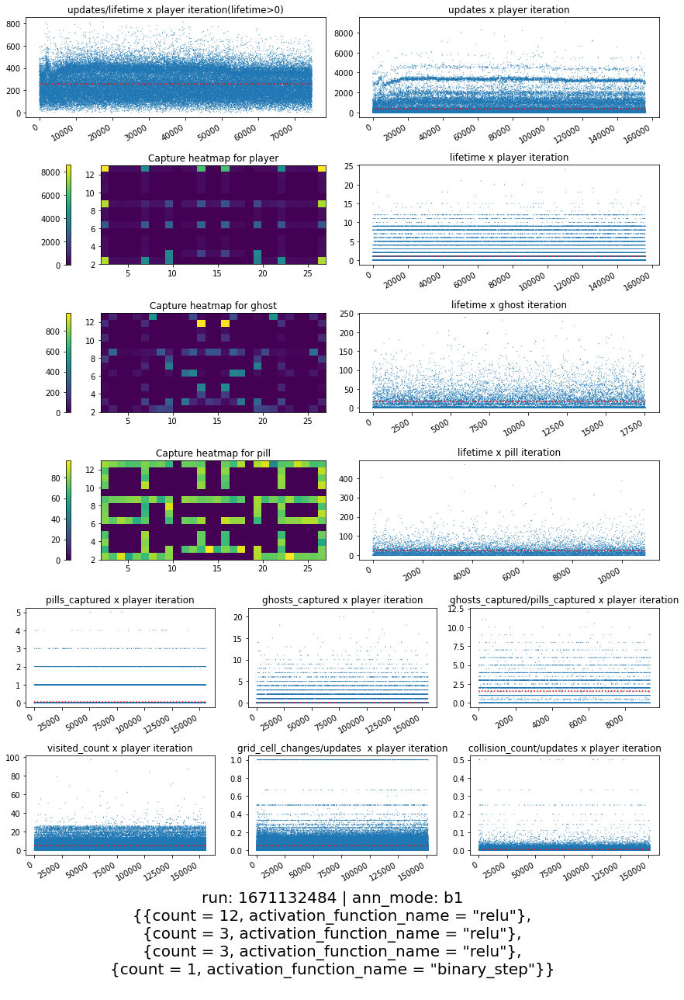

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.4697869100860593 rs: 0.6511255791008902 T: 0.49830390396614055
updates/lifetime updates r: 0.5821736785319913 rs: 0.9514219371543096 T: 0.8700435473491933
updates/lifetime visited_count r: 0.10019522262295655 rs: 0.0804624530950128 T: 0.05595501540233687
updates/lifetime grid_cell_changes r: 0.15457581312407978 rs: 0.18194411015140657 T: 0.1259725789498032
updates/lifetime collision_count r: 0.07964012892078082 rs: 0.0754597746246256 T: 0.061629052231077494
updates/lifetime ghosts_captured r: 0.2395916493703248 rs: 0.3369440614251411 T: 0.2709595068797102
updates/lifetime pills_captured r: 0.36399780898571893 rs: 0.4210282216779809 T: 0.3412008109483476
Updates e as outras metricas
updates lifetime r: 0.9713239161776933 rs: 0.6855057989239675 T: 0.5833960099675394
updates visited_count r: 0.19297873700140783 rs: 0.2640308089783472 T: 0.19132673011247658
updates grid_cell_changes r: 0.2542655884848836 rs: 0.347091

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

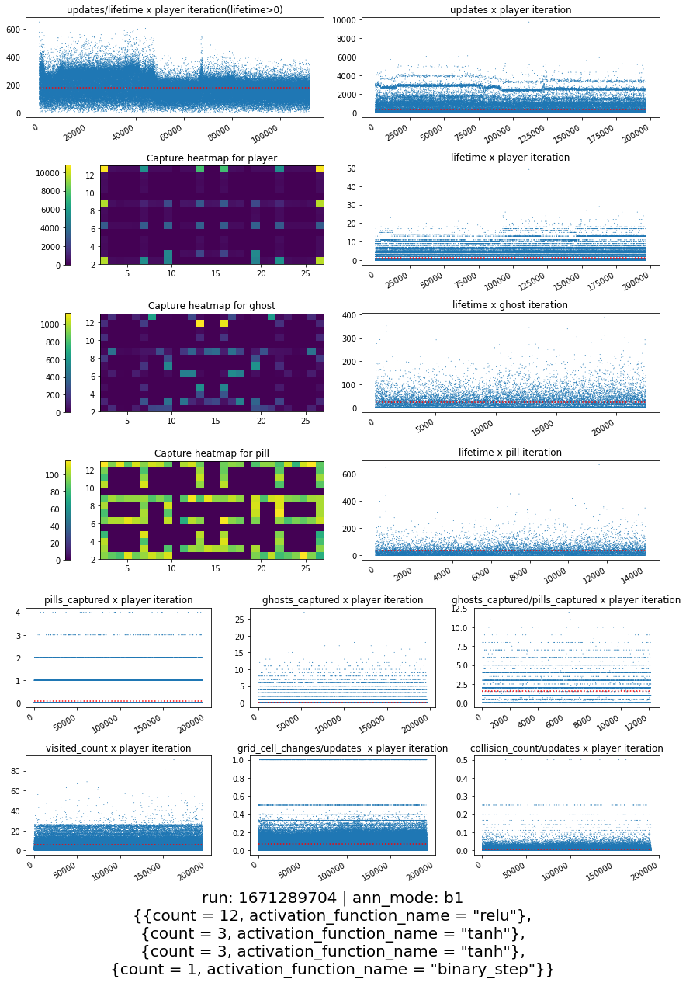

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.31807479302088254 rs: 0.46898611369453574 T: 0.3571794742833107
updates/lifetime updates r: 0.4659856667521095 rs: 0.8889528622295764 T: 0.7937372711330113
updates/lifetime visited_count r: 0.11037246144639216 rs: 0.09199788508908333 T: 0.06444406180760871
updates/lifetime grid_cell_changes r: 0.1477842426438096 rs: 0.19913210393241215 T: 0.13847982078250484
updates/lifetime collision_count r: 0.07628975884702419 rs: 0.07124988688637338 T: 0.05822977954879555
updates/lifetime ghosts_captured r: 0.17984537023274735 rs: 0.25195670983823 T: 0.20306229052018462
updates/lifetime pills_captured r: 0.2679261177348492 rs: 0.312897582937961 T: 0.2540892404515622
Updates e as outras metricas
updates lifetime r: 0.9645852982060963 rs: 0.7361769787552126 T: 0.6284541789309684
updates visited_count r: 0.19678929762949451 rs: 0.28071328663076545 T: 0.20363004531206663
updates grid_cell_changes r: 0.26857430082341993 rs: 0.3854

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

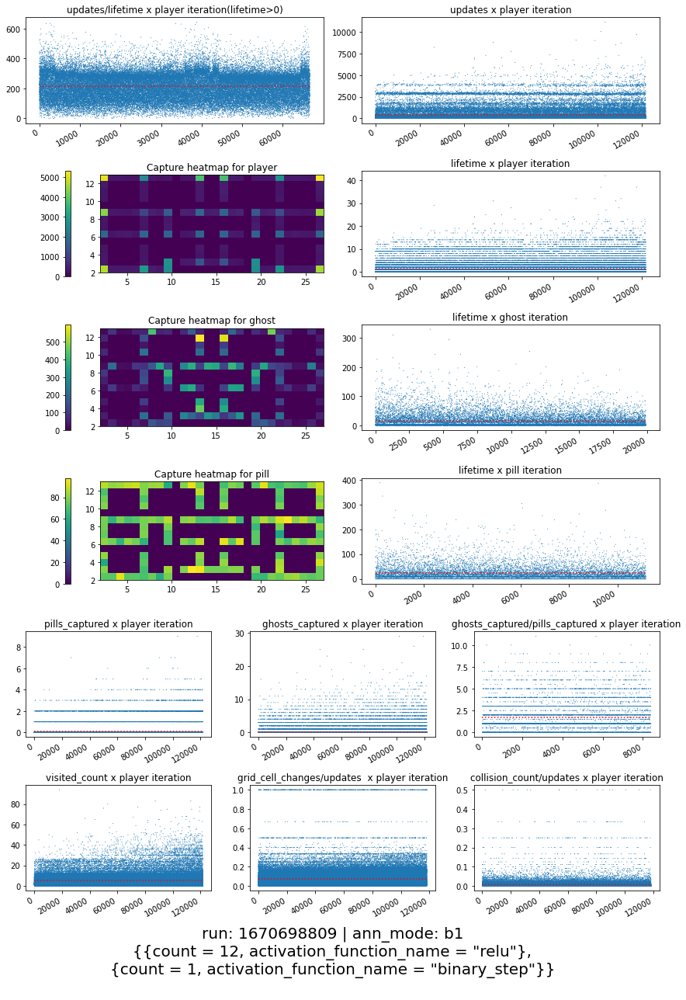

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.380154219009869 rs: 0.5726340117017021 T: 0.43590045375797454
updates/lifetime updates r: 0.4809645954113824 rs: 0.9114837391952874 T: 0.8086854578949781
updates/lifetime visited_count r: 0.15127453846907932 rs: 0.13501459841693936 T: 0.09482126312766853
updates/lifetime grid_cell_changes r: 0.24888122538408722 rs: 0.33114595945607816 T: 0.23089856820983662
updates/lifetime collision_count r: 0.021590028935163263 rs: 0.0013008107127389708 T: 0.0011887541518274792
updates/lifetime ghosts_captured r: 0.19718209328443448 rs: 0.3073166497498264 T: 0.24605113444896332
updates/lifetime pills_captured r: 0.2833303878135132 rs: 0.3714144101849843 T: 0.29917937622918483
Updates e as outras metricas
updates lifetime r: 0.982307964325521 rs: 0.7499972151062257 T: 0.644758539634228
updates visited_count r: 0.3266585281503337 rs: 0.3000704068034421 T: 0.21901205760678472
updates grid_cell_changes r: 0.5586110227268563 rs: 0.4

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

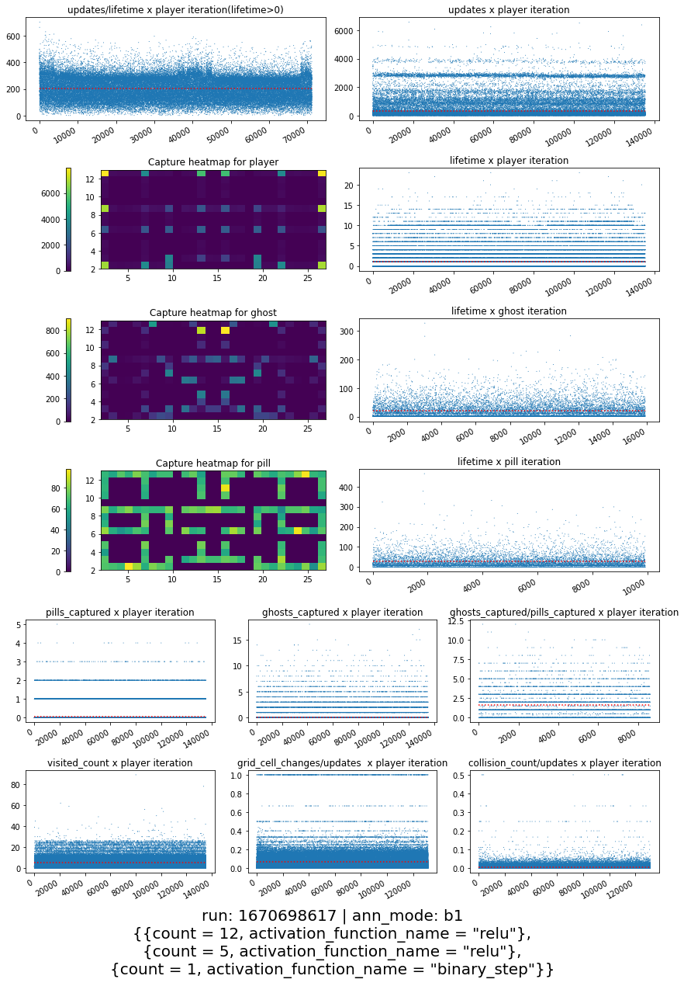

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.4282594323309317 rs: 0.6163120178031256 T: 0.4702892002168496
updates/lifetime updates r: 0.5310083513173784 rs: 0.9435302592954854 T: 0.858378808452364
updates/lifetime visited_count r: 0.11809264421540691 rs: 0.10028138382978569 T: 0.06975736537131752
updates/lifetime grid_cell_changes r: 0.15184185556495344 rs: 0.18364755308581188 T: 0.12788341888511845
updates/lifetime collision_count r: 0.10305883972409817 rs: 0.09394604414473094 T: 0.07679678470700937
updates/lifetime ghosts_captured r: 0.2264708810470226 rs: 0.3240063986420058 T: 0.26056157389229123
updates/lifetime pills_captured r: 0.33704824323453514 rs: 0.40495710955773073 T: 0.3287426007133272
Updates e as outras metricas
updates lifetime r: 0.978236810091663 rs: 0.7156411154868515 T: 0.6116974250542706
updates visited_count r: 0.19078192513276504 rs: 0.2905280175081997 T: 0.21068604073436112
updates grid_cell_changes r: 0.24401295343574647 rs: 0.3617

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

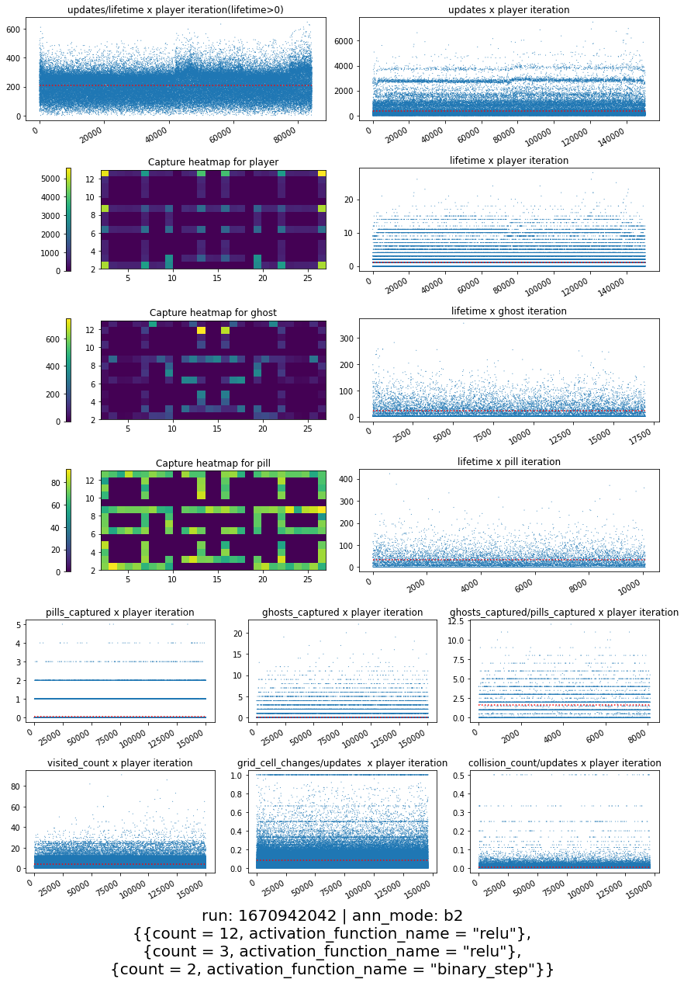

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.3391415724491674 rs: 0.5147126135104905 T: 0.3954075823834046
updates/lifetime updates r: 0.454834258341185 rs: 0.9061039344727991 T: 0.8065671307615737
updates/lifetime visited_count r: 0.09294880504214613 rs: 0.11204878071509193 T: 0.08005190691625007
updates/lifetime grid_cell_changes r: 0.2369680572951943 rs: 0.35026214950352647 T: 0.24369009598453534
updates/lifetime collision_count r: 0.002357242171427503 rs: -0.018908817092675917 T: -0.015228997952262516
updates/lifetime ghosts_captured r: 0.17131296998475562 rs: 0.2595551863038278 T: 0.20934706433460093
updates/lifetime pills_captured r: 0.24884841020137888 rs: 0.3156460469982558 T: 0.25622273483102265
Updates e as outras metricas
updates lifetime r: 0.9777751074157753 rs: 0.7473449144098678 T: 0.6408298072809779
updates visited_count r: 0.24551131280960517 rs: 0.27919605371121 T: 0.2066360752383123
updates grid_cell_changes r: 0.4680176682194736 rs: 0.49

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

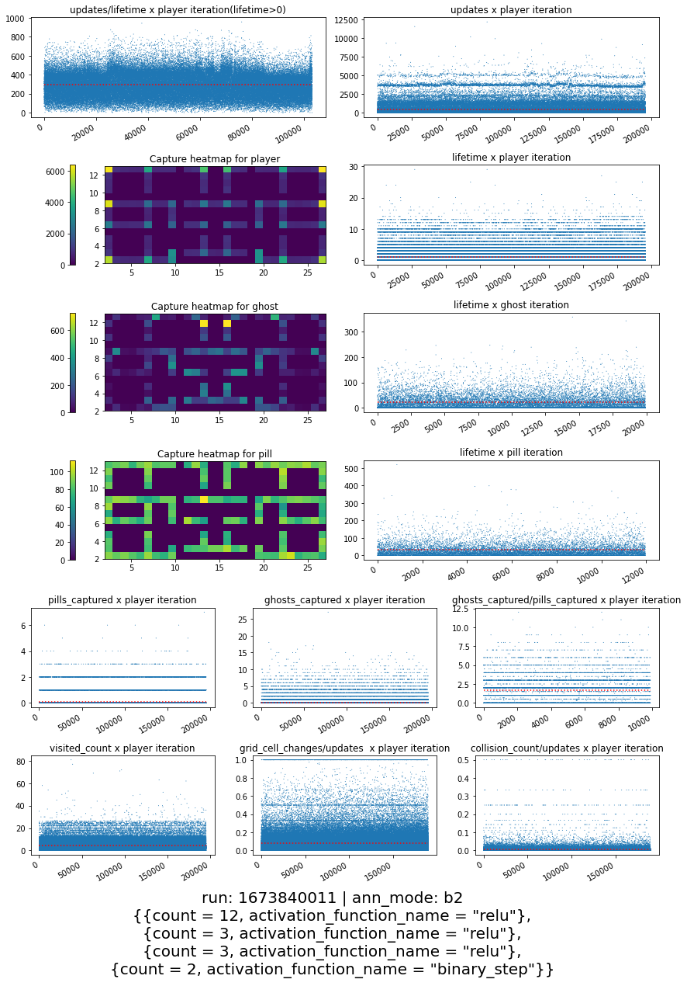

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.3572126876840184 rs: 0.5374151065053969 T: 0.414346486128153
updates/lifetime updates r: 0.4887985236921171 rs: 0.9192290669554566 T: 0.8243221431741615
updates/lifetime visited_count r: 0.10982444410137832 rs: 0.20291449700713718 T: 0.14696932288188197
updates/lifetime grid_cell_changes r: 0.260520432237266 rs: 0.3768099433612569 T: 0.2638098430460249
updates/lifetime collision_count r: -0.01650348048449502 rs: -0.030760368499015218 T: -0.025040579053362655
updates/lifetime ghosts_captured r: 0.18459955444489554 rs: 0.2713599481698705 T: 0.21882957593466645
updates/lifetime pills_captured r: 0.263989245053785 rs: 0.32787777396958573 T: 0.266053773562282
Updates e as outras metricas
updates lifetime r: 0.9709400632820471 rs: 0.7287123285419922 T: 0.6222996292656933
updates visited_count r: 0.2547876143279456 rs: 0.3559439590593974 T: 0.2686171357678013
updates grid_cell_changes r: 0.4823856374318283 rs: 0.5400136

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

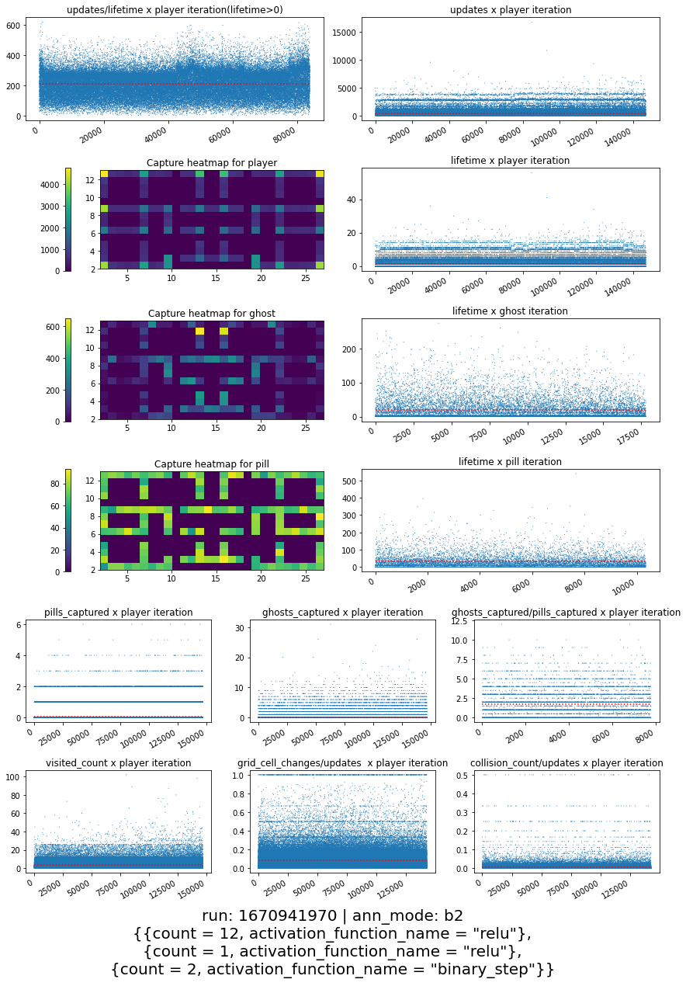

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.32040003358107166 rs: 0.49444271685502805 T: 0.38064044060655616
updates/lifetime updates r: 0.43534491637809275 rs: 0.8947187555243616 T: 0.7919941263919446
updates/lifetime visited_count r: 0.10004228985249643 rs: 0.14153834554804334 T: 0.10253121790541349
updates/lifetime grid_cell_changes r: 0.2570047675478256 rs: 0.3837795675163132 T: 0.26667820640202067
updates/lifetime collision_count r: 0.00702566645751913 rs: -0.01776263371284795 T: -0.014257328897027813
updates/lifetime ghosts_captured r: 0.16444339498485322 rs: 0.25316608377040567 T: 0.20424785212337584
updates/lifetime pills_captured r: 0.23289695386529 rs: 0.3015295950055375 T: 0.2443987580667199
Updates e as outras metricas
updates lifetime r: 0.978908715543365 rs: 0.7579241026066316 T: 0.6508728254250699
updates visited_count r: 0.2699243228359858 rs: 0.307157155243491 T: 0.23031655066031442
updates grid_cell_changes r: 0.5444960657067645 rs: 0.534

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

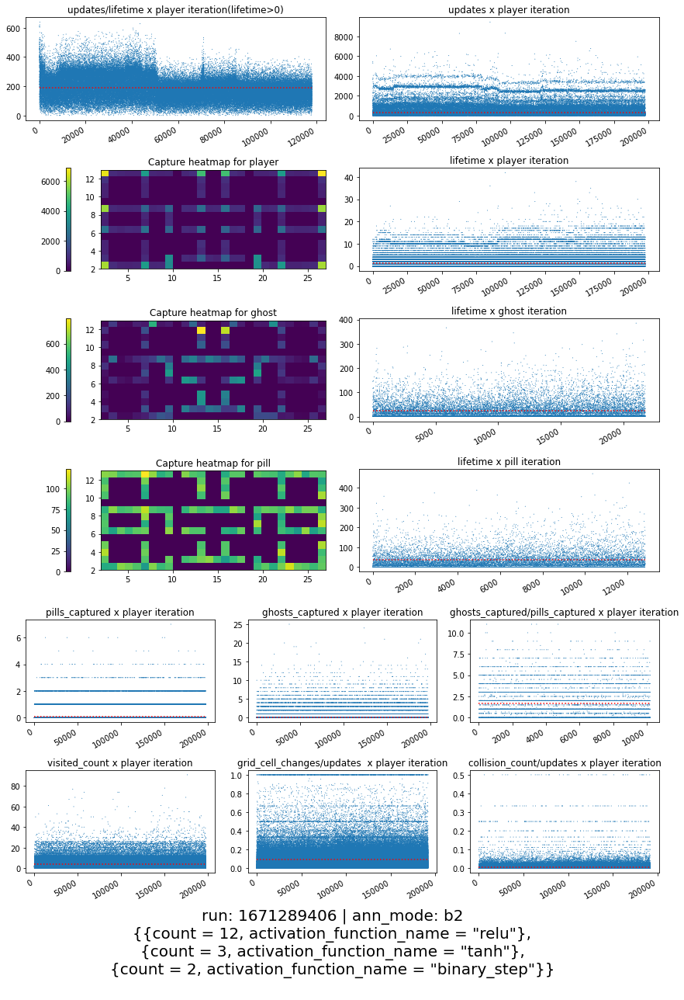

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.24905224555170355 rs: 0.3925352833685553 T: 0.301038528794784
updates/lifetime updates r: 0.4080941243330033 rs: 0.8486314414748007 T: 0.7454376047873452
updates/lifetime visited_count r: 0.07688861446975509 rs: 0.10284584212844536 T: 0.07376743939913508
updates/lifetime grid_cell_changes r: 0.21458832383786472 rs: 0.3262504964492364 T: 0.22552328746216005
updates/lifetime collision_count r: -0.008057717748391662 rs: -0.019517221140922157 T: -0.01574757479089579
updates/lifetime ghosts_captured r: 0.1375585421820363 rs: 0.20629520317024355 T: 0.1665229727339631
updates/lifetime pills_captured r: 0.1969005020941583 rs: 0.24825425503811427 T: 0.20133661401233574
Updates e as outras metricas
updates lifetime r: 0.9630906817963361 rs: 0.7631902701788098 T: 0.6533405297530748
updates visited_count r: 0.259468665835468 rs: 0.29231046237520625 T: 0.21782819862646144
updates grid_cell_changes r: 0.500800997324307 rs: 0.5

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

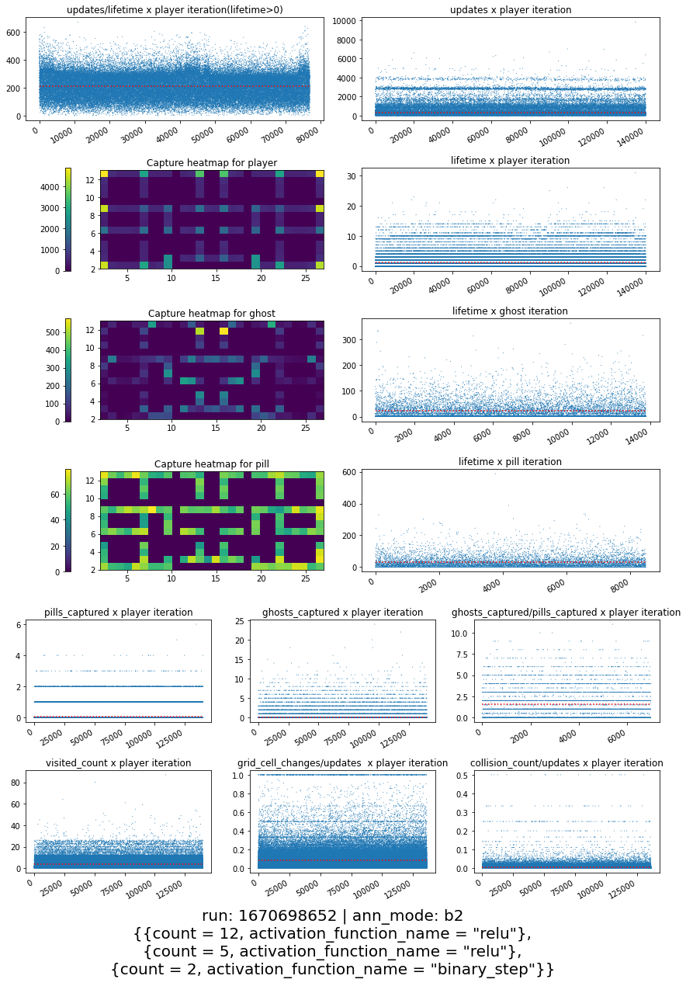

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.3456893751049588 rs: 0.5201160123587732 T: 0.40129975923103833
updates/lifetime updates r: 0.4662171055886742 rs: 0.9132772100849997 T: 0.8165027094660972
updates/lifetime visited_count r: 0.07544957897526895 rs: 0.10983859776397426 T: 0.07906846185443164
updates/lifetime grid_cell_changes r: 0.24638272024438512 rs: 0.35130397498960764 T: 0.24376623947446144
updates/lifetime collision_count r: -0.024981523897840155 rs: -0.033371807084883964 T: -0.02716104700025477
updates/lifetime ghosts_captured r: 0.1699743763821188 rs: 0.25611993003694566 T: 0.20674873437060476
updates/lifetime pills_captured r: 0.251043953908584 rs: 0.3150737322235722 T: 0.2557651738807368
Updates e as outras metricas
updates lifetime r: 0.975678912827456 rs: 0.7354732932453176 T: 0.6294270422429836
updates visited_count r: 0.22398812741470175 rs: 0.2718177695601301 T: 0.20255747937750532
updates grid_cell_changes r: 0.4391642120759711 rs: 0.

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

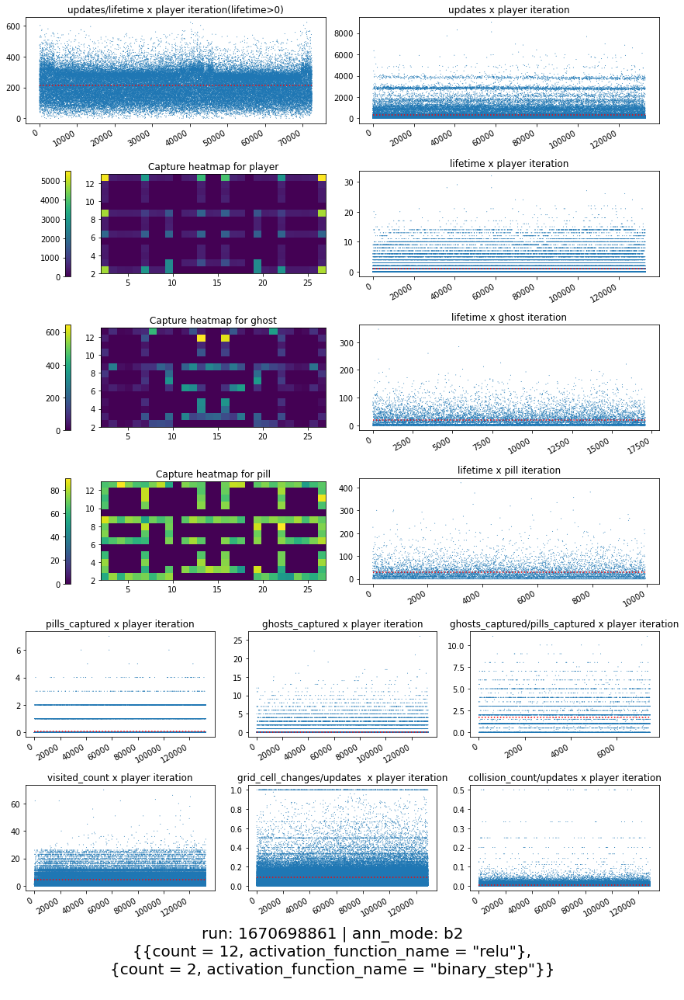

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.35975198323229324 rs: 0.5474707412727985 T: 0.4205429021824296
updates/lifetime updates r: 0.4690504099196209 rs: 0.9178500111111322 T: 0.820818175117324
updates/lifetime visited_count r: 0.08093593305012911 rs: 0.09366891960075413 T: 0.06648858553708234
updates/lifetime grid_cell_changes r: 0.23706304063320677 rs: 0.33278698115703903 T: 0.23138349945086142
updates/lifetime collision_count r: -0.004795821904865305 rs: -0.022233126682902473 T: -0.017938266467029788
updates/lifetime ghosts_captured r: 0.18774810334583328 rs: 0.2836322253007301 T: 0.22829010419420506
updates/lifetime pills_captured r: 0.2656381309630045 rs: 0.34023283232156776 T: 0.2750143553634869
Updates e as outras metricas
updates lifetime r: 0.9794288413047623 rs: 0.7384905936308653 T: 0.6328908598359808
updates visited_count r: 0.21613780724927814 rs: 0.2645641028996056 T: 0.19467678201605446
updates grid_cell_changes r: 0.5034826814677498 rs:

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

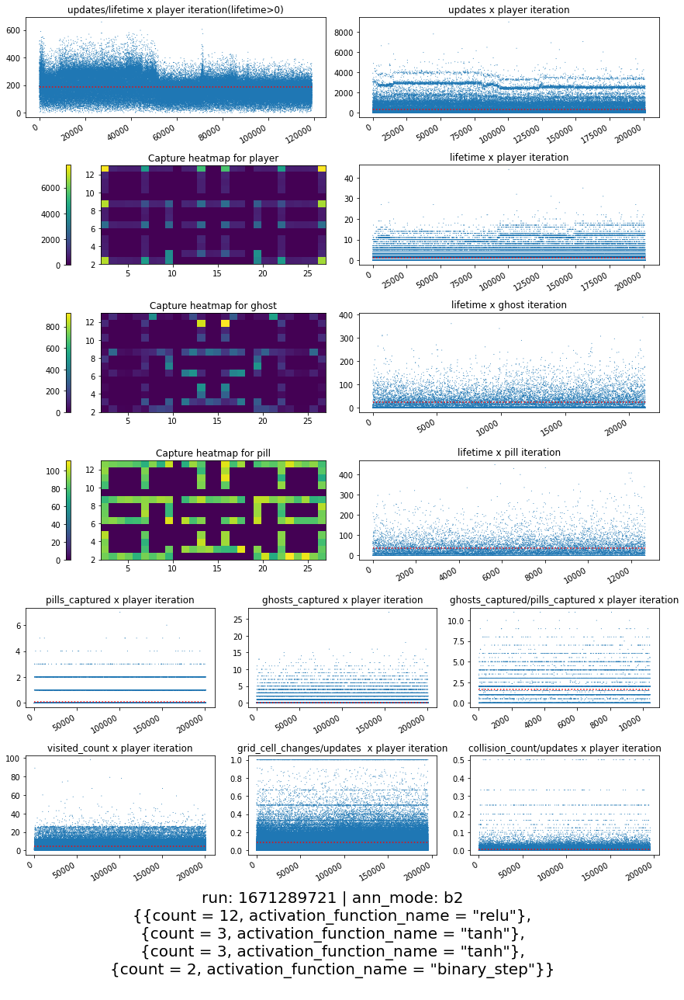

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.2595551310534441 rs: 0.4035642468600036 T: 0.3092386145961248
updates/lifetime updates r: 0.4176807296972213 rs: 0.8598820397040836 T: 0.7594811079237879
updates/lifetime visited_count r: 0.06642045873956963 rs: 0.07671301849361323 T: 0.054779856671281116
updates/lifetime grid_cell_changes r: 0.20893984999015536 rs: 0.3046869135191244 T: 0.21122435734666287
updates/lifetime collision_count r: -0.02003837096098483 rs: -0.027312788663155202 T: -0.022163013238029963
updates/lifetime ghosts_captured r: 0.14238537393003348 rs: 0.20896725112911044 T: 0.1687385010332327
updates/lifetime pills_captured r: 0.20796681798998432 rs: 0.2558089245347593 T: 0.20769277000086517
Updates e as outras metricas
updates lifetime r: 0.9629255475585212 rs: 0.7529752465702234 T: 0.6437527972489265
updates visited_count r: 0.21932831288923546 rs: 0.2654173786072981 T: 0.19636417860146546
updates grid_cell_changes r: 0.43270107346835324 rs

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

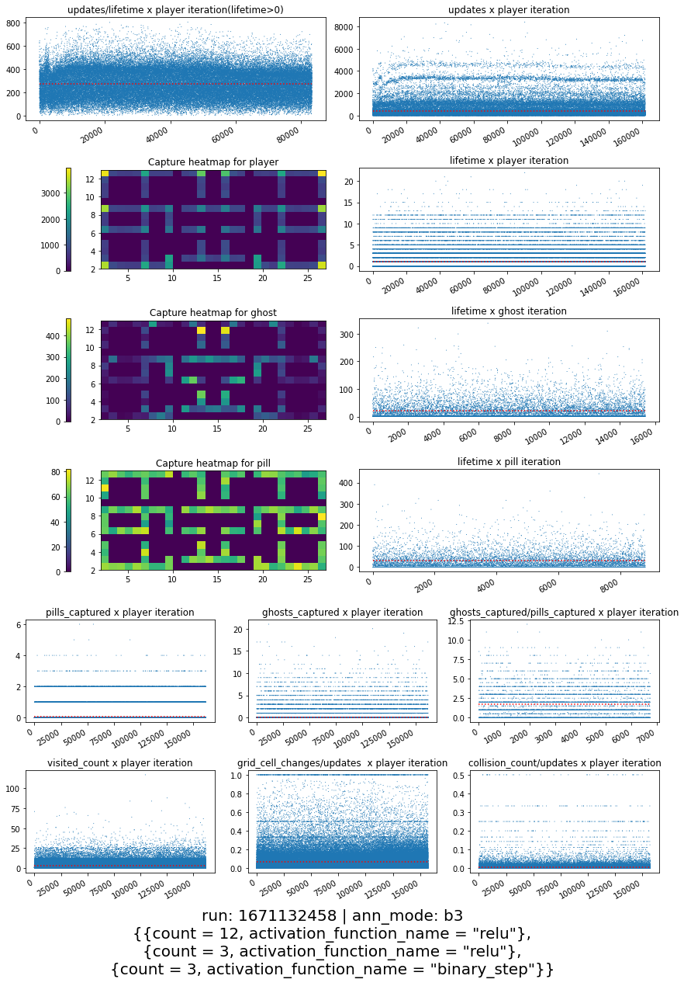

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.35770712407085536 rs: 0.5403498253690072 T: 0.41795337953694683
updates/lifetime updates r: 0.4974515947682403 rs: 0.9254703205767632 T: 0.8335711942764725
updates/lifetime visited_count r: 0.09653975564065355 rs: 0.14859843589600813 T: 0.10951347506515191
updates/lifetime grid_cell_changes r: 0.25658678208214886 rs: 0.3444448435197254 T: 0.24223744678054066
updates/lifetime collision_count r: -0.004513823193324532 rs: -0.02141684393015374 T: -0.01742655642025865
updates/lifetime ghosts_captured r: 0.17134546627842648 rs: 0.2556643689512876 T: 0.20638879874532318
updates/lifetime pills_captured r: 0.24541051261861851 rs: 0.3044609252076352 T: 0.2467219709508409
Updates e as outras metricas
updates lifetime r: 0.9669424202079049 rs: 0.7144763063207886 T: 0.6087950837076346
updates visited_count r: 0.25566437743887593 rs: 0.26698620433094805 T: 0.20170517592719964
updates grid_cell_changes r: 0.48970568552590565 rs

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

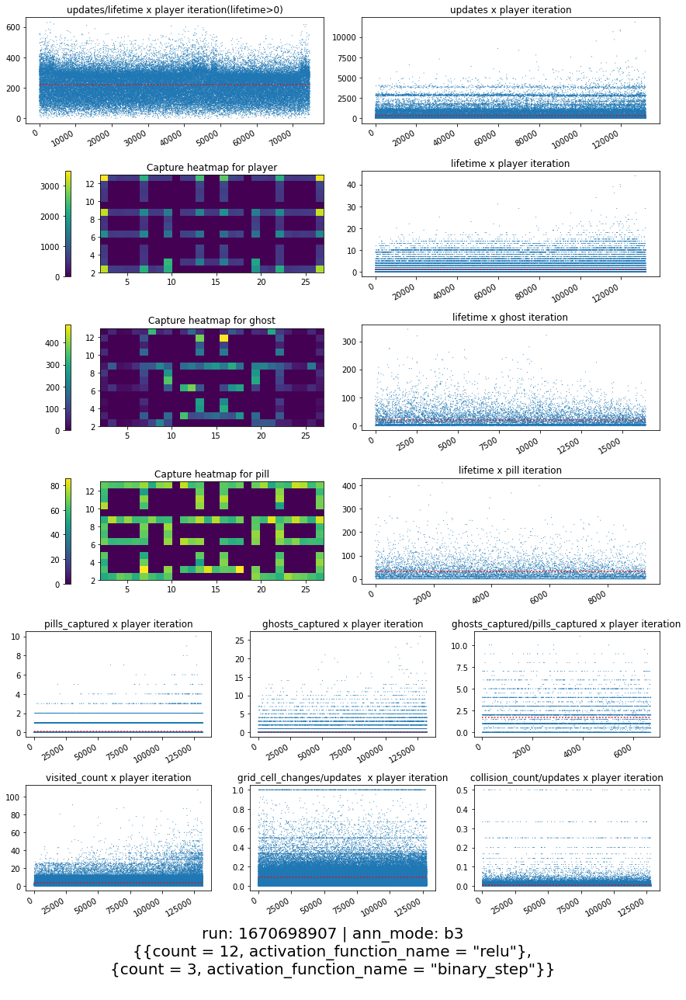

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.31044009885953566 rs: 0.4897885634042408 T: 0.37731287860595714
updates/lifetime updates r: 0.42884526670932516 rs: 0.8928076350405711 T: 0.7890434734280592
updates/lifetime visited_count r: 0.11596245788221414 rs: 0.18095823682621254 T: 0.13197211775601975
updates/lifetime grid_cell_changes r: 0.24862694679371222 rs: 0.40842872987982143 T: 0.28451447351739534
updates/lifetime collision_count r: 0.004401925214086792 rs: -0.019035155263865264 T: -0.015375736476141977
updates/lifetime ghosts_captured r: 0.15566859417671836 rs: 0.2464391811264499 T: 0.19851796407362335
updates/lifetime pills_captured r: 0.21713536497661273 rs: 0.292703065560705 T: 0.2365536986621988
Updates e as outras metricas
updates lifetime r: 0.979022129122245 rs: 0.7570656866949826 T: 0.6499449511355591
updates visited_count r: 0.31532922880199205 rs: 0.33983274016466014 T: 0.25825124736384497
updates grid_cell_changes r: 0.6041861852481099 rs

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

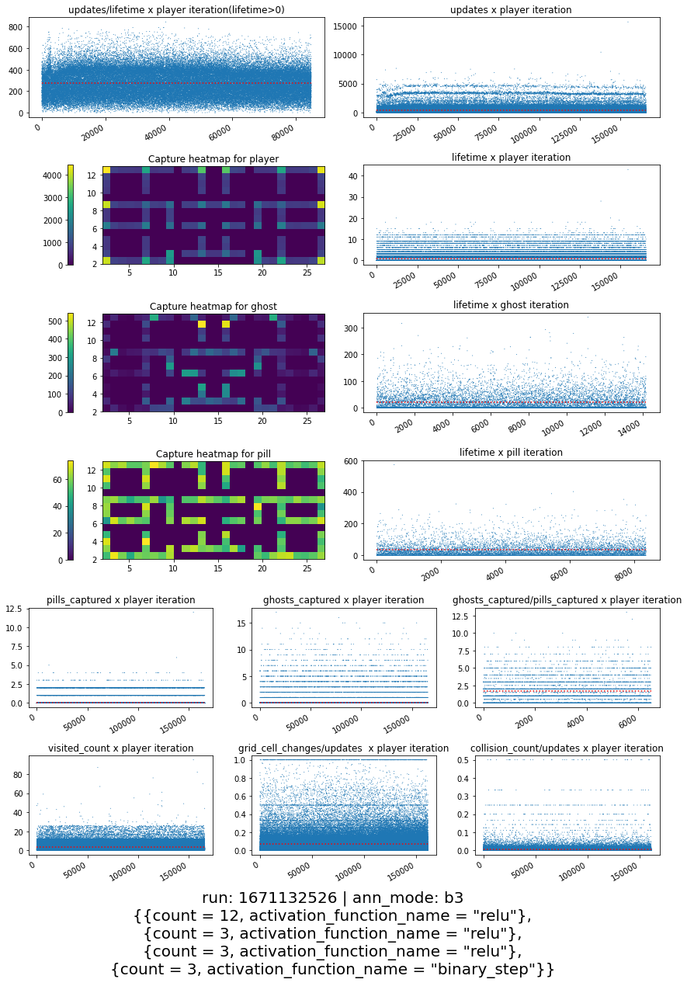

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.35249264431376703 rs: 0.5350010942831361 T: 0.41458160604395555
updates/lifetime updates r: 0.4970072424134423 rs: 0.927059033430622 T: 0.836414502475959
updates/lifetime visited_count r: 0.049435628955885796 rs: 0.11246331413242616 T: 0.08338827360480967
updates/lifetime grid_cell_changes r: 0.26165472880870244 rs: 0.32583391852564625 T: 0.22855192795024884
updates/lifetime collision_count r: -0.0335057388577343 rs: -0.03903852722813897 T: -0.03186579096183433
updates/lifetime ghosts_captured r: 0.16671185356789733 rs: 0.2453132024167614 T: 0.19821280646028136
updates/lifetime pills_captured r: 0.23802983115146564 rs: 0.29632479538739065 T: 0.24030431817824993
Updates e as outras metricas
updates lifetime r: 0.9650858517997217 rs: 0.711234829542799 T: 0.6054321715508024
updates visited_count r: 0.20387190893048493 rs: 0.23739844510725228 T: 0.17993701944532148
updates grid_cell_changes r: 0.4665617240000971 rs: 

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

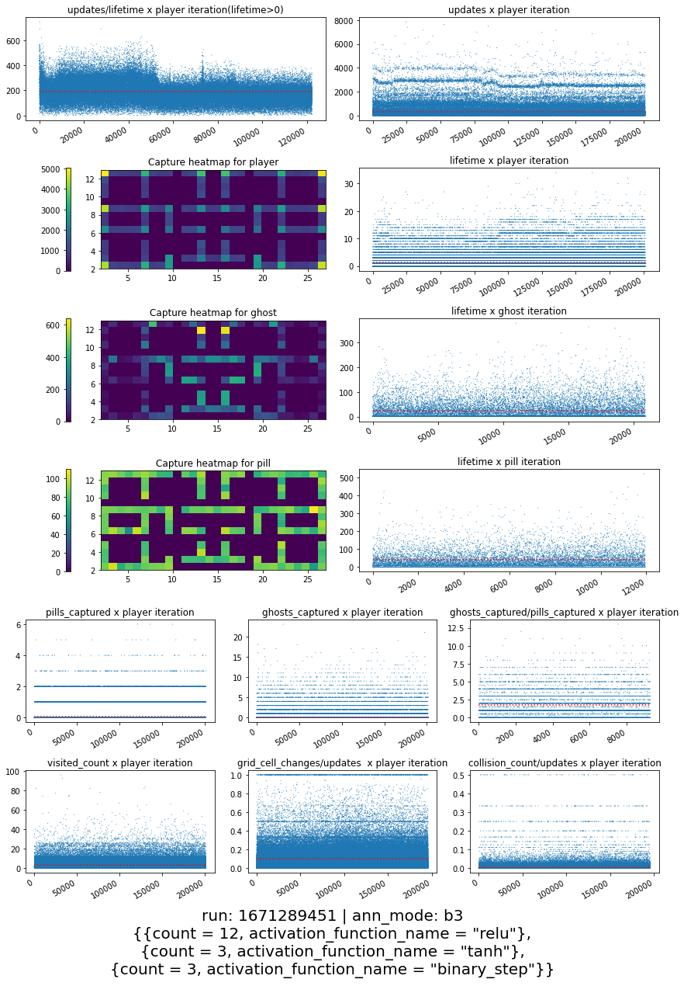

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.2240118241126989 rs: 0.3596303967175629 T: 0.2768075996064989
updates/lifetime updates r: 0.39007076925157746 rs: 0.8359978614859059 T: 0.7322570316274059
updates/lifetime visited_count r: 0.08783096054586635 rs: 0.15110979619143444 T: 0.11002054441151414
updates/lifetime grid_cell_changes r: 0.22875553945855795 rs: 0.3615588884996576 T: 0.25055110301726136
updates/lifetime collision_count r: -0.01258865831398086 rs: -0.026193369998046133 T: -0.02120517797989277
updates/lifetime ghosts_captured r: 0.12233572462451356 rs: 0.18533704759190306 T: 0.14980676400705137
updates/lifetime pills_captured r: 0.1734490447459173 rs: 0.22232878562210617 T: 0.18039745428418122
Updates e as outras metricas
updates lifetime r: 0.9614959138060759 rs: 0.7690618014621633 T: 0.6583415181836655
updates visited_count r: 0.2828862242733721 rs: 0.3461145613658979 T: 0.2632951140241165
updates grid_cell_changes r: 0.5749678417431663 rs: 0

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

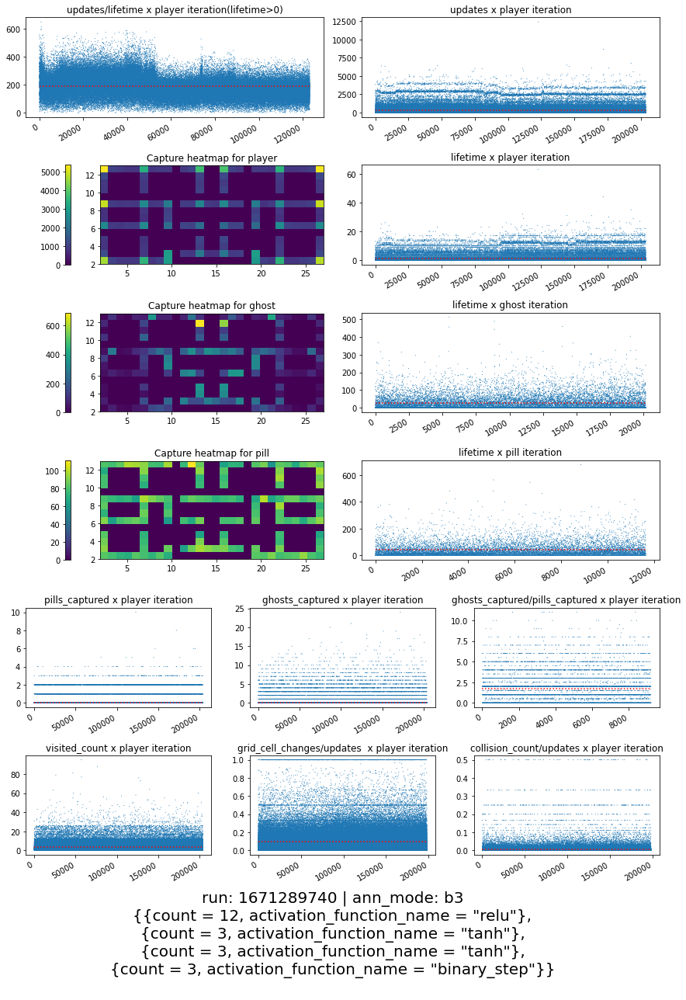

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.22862555546595972 rs: 0.3643912975069594 T: 0.2804952712053867
updates/lifetime updates r: 0.3943109905524819 rs: 0.8396854399938721 T: 0.7373001917669814
updates/lifetime visited_count r: 0.08317127177121303 rs: 0.14210376273983719 T: 0.10361878830111337
updates/lifetime grid_cell_changes r: 0.22776701547362188 rs: 0.3530321531629448 T: 0.2444111153871218
updates/lifetime collision_count r: -0.008868797061673843 rs: -0.0194052298941173 T: -0.01571375414931649
updates/lifetime ghosts_captured r: 0.12438304312239032 rs: 0.18670283388014908 T: 0.1509689225710911
updates/lifetime pills_captured r: 0.17510450762958304 rs: 0.22360941454732694 T: 0.18146993152312632
Updates e as outras metricas
updates lifetime r: 0.9619634747020137 rs: 0.7657474921223366 T: 0.655318922910114
updates visited_count r: 0.25943702847986966 rs: 0.3331826529472248 T: 0.25322105808919615
updates grid_cell_changes r: 0.5428345231419115 rs: 0.

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

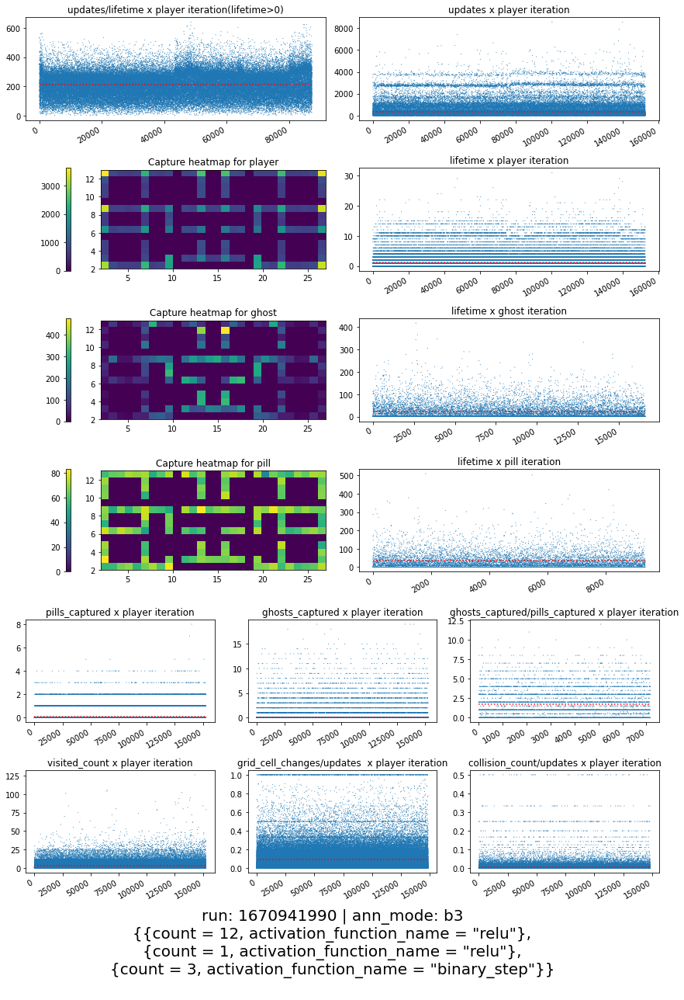

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.3024871552307534 rs: 0.4688612611215436 T: 0.36150030085424817
updates/lifetime updates r: 0.42700373120858254 rs: 0.8879667275571682 T: 0.7850714314667826
updates/lifetime visited_count r: 0.11035453839863463 rs: 0.18737852928725784 T: 0.13714429418586246
updates/lifetime grid_cell_changes r: 0.2599019380193867 rs: 0.4121947928992309 T: 0.2870895241885406
updates/lifetime collision_count r: -0.005003875167162204 rs: -0.025322734717596624 T: -0.02046569674215843
updates/lifetime ghosts_captured r: 0.14916994771540112 rs: 0.23031646942026363 T: 0.185947295605717
updates/lifetime pills_captured r: 0.21270646860468348 rs: 0.2753715541256805 T: 0.22348915610740813
Updates e as outras metricas
updates lifetime r: 0.9767963224119109 rs: 0.7590951964553323 T: 0.6513847547404615
updates visited_count r: 0.2884389284342687 rs: 0.3511644721338009 T: 0.26729530691463704
updates grid_cell_changes r: 0.5733846195530838 rs: 0.

<Figure size 432x288 with 0 Axes>

<Figure size 864x1296 with 0 Axes>

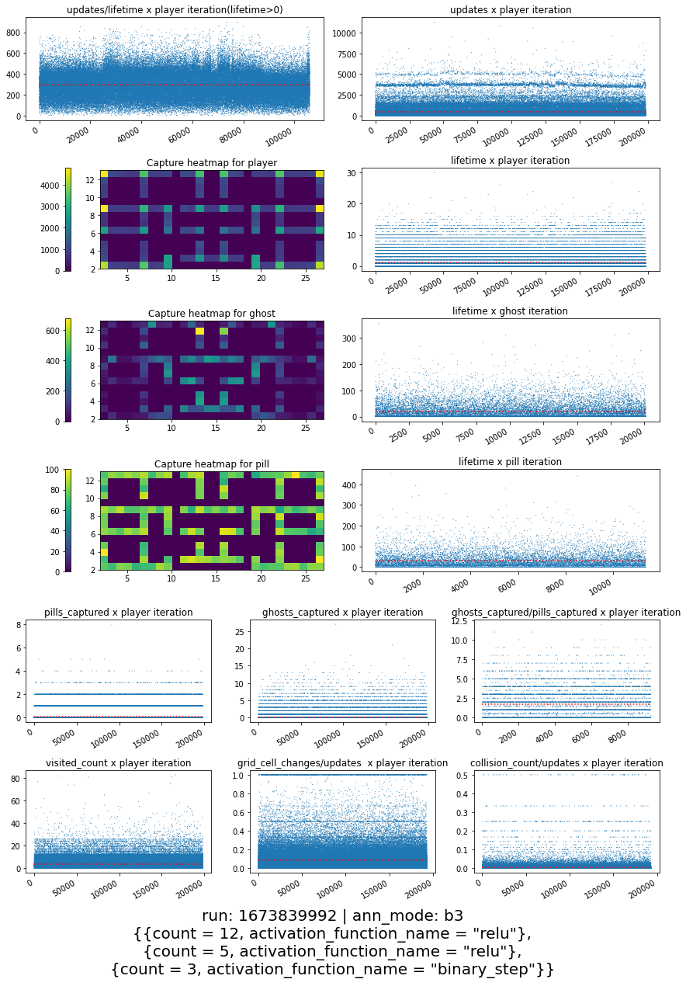

A taxa de atualizacao e as outras metricas
updates/lifetime lifetime r: 0.33737464279563795 rs: 0.5110002540516537 T: 0.39495561540328805
updates/lifetime updates r: 0.475713453664764 rs: 0.9103909796101485 T: 0.8132180266313577
updates/lifetime visited_count r: 0.1397567535235908 rs: 0.2638675129886842 T: 0.19380137818080942
updates/lifetime grid_cell_changes r: 0.2701026038816682 rs: 0.4213406092706473 T: 0.29506441714329
updates/lifetime collision_count r: -0.006941295245434056 rs: -0.022587930589820428 T: -0.01834743759465566
updates/lifetime ghosts_captured r: 0.17081132480711247 rs: 0.2535126898517798 T: 0.20450958525182553
updates/lifetime pills_captured r: 0.24116222195607384 rs: 0.3014985428788763 T: 0.24479942939155622
Updates e as outras metricas
updates lifetime r: 0.9694509683247061 rs: 0.734479009859245 T: 0.6274105591730584
updates visited_count r: 0.30917827331620895 rs: 0.42039162983853595 T: 0.32297732064305185
updates grid_cell_changes r: 0.541518809255475 rs: 0.5789

In [5]:
errors = list()
paths_dict = dict()
for path in selected_paths:
	paths_dict[path], load_errors = analyse_all_in_path(path)
	errors.extend(load_errors)
	if TEST == True:
		break

# run count
run_count = 0
for index, path_dict in paths_dict.items():
	for _, run_dict in path_dict.items():
		run_count = run_count + 1
		errors.extend(tools.generate_run_report_from_dict(run_dict))

print("Path count: ", len(paths_dict.keys()))
print("Run count: ", run_count)
print("Errors:\n" + str(errors))